Original Image:


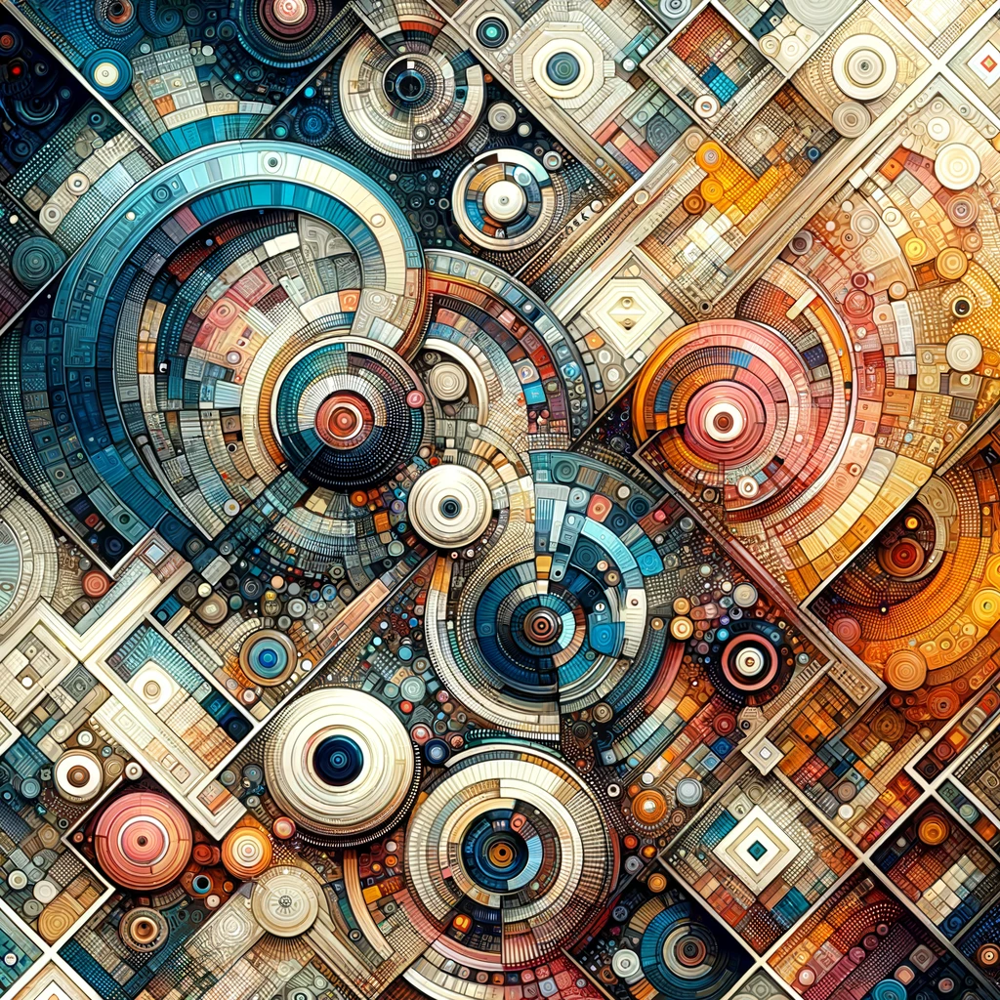

In [5]:
import numpy as np
from PIL import Image
from IPython.display import display

original_image = Image.open("1024.png")

print("Original Image:")
display(original_image)

Resized Image using Nearest Neighbor Method:


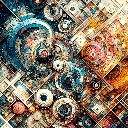

Resized Image using Bilinear Interpolation Method:


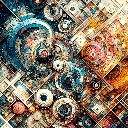

In [6]:
# 1024*1024->128*128
def nearest_neighbor_resize(image, new_width, new_height):
    original_width, original_height = image.size
    resized_image = Image.new("RGB", (new_width, new_height))
    pixels = resized_image.load()

    for i in range(new_width):
        for j in range(new_height):
            x = int(i * (original_width / new_width))
            y = int(j * (original_height / new_height))
            pixels[i, j] = image.getpixel((x, y))

    return resized_image

def bilinear_interpolation_resize(image, new_width, new_height):
    original_width, original_height = image.size
    resized_image = Image.new("RGB", (new_width, new_height))
    pixels = resized_image.load()

    for i in range(new_width):
        for j in range(new_height):
            x = i * (original_width / new_width)
            y = j * (original_height / new_height)

            x1, y1 = int(x), int(y)
            x2, y2 = min(x1 + 1, original_width - 1), min(y1 + 1, original_height - 1)

            r1 = (x2 - x) * np.array(image.getpixel((x1, y1))) + (x - x1) * np.array(image.getpixel((x2, y1)))
            r2 = (x2 - x) * np.array(image.getpixel((x1, y2))) + (x - x1) * np.array(image.getpixel((x2, y2)))

            pixels[i, j] = tuple(((y2 - y) * r1 + (y - y1) * r2).astype(int))

    return resized_image

original_image = Image.open("1024.png")

nn_resized_image = nearest_neighbor_resize(original_image, 128, 128)
print("Resized Image using Nearest Neighbor Method:")
display(nn_resized_image)

bilinear_resized_image = bilinear_interpolation_resize(original_image, 128, 128)
print("Resized Image using Bilinear Interpolation Method:")
display(bilinear_resized_image)

Resized Image using Nearest Neighbor Method:


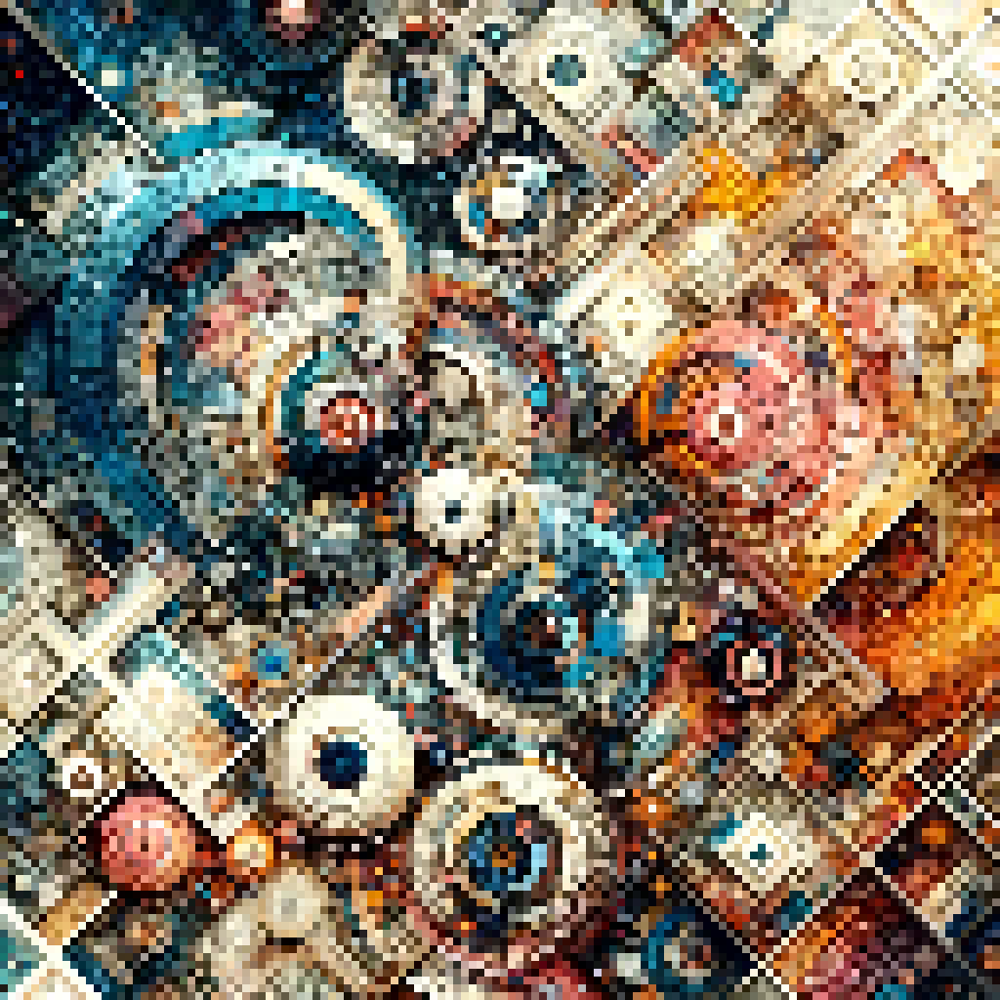

Resized Image using Bilinear Interpolation Method:


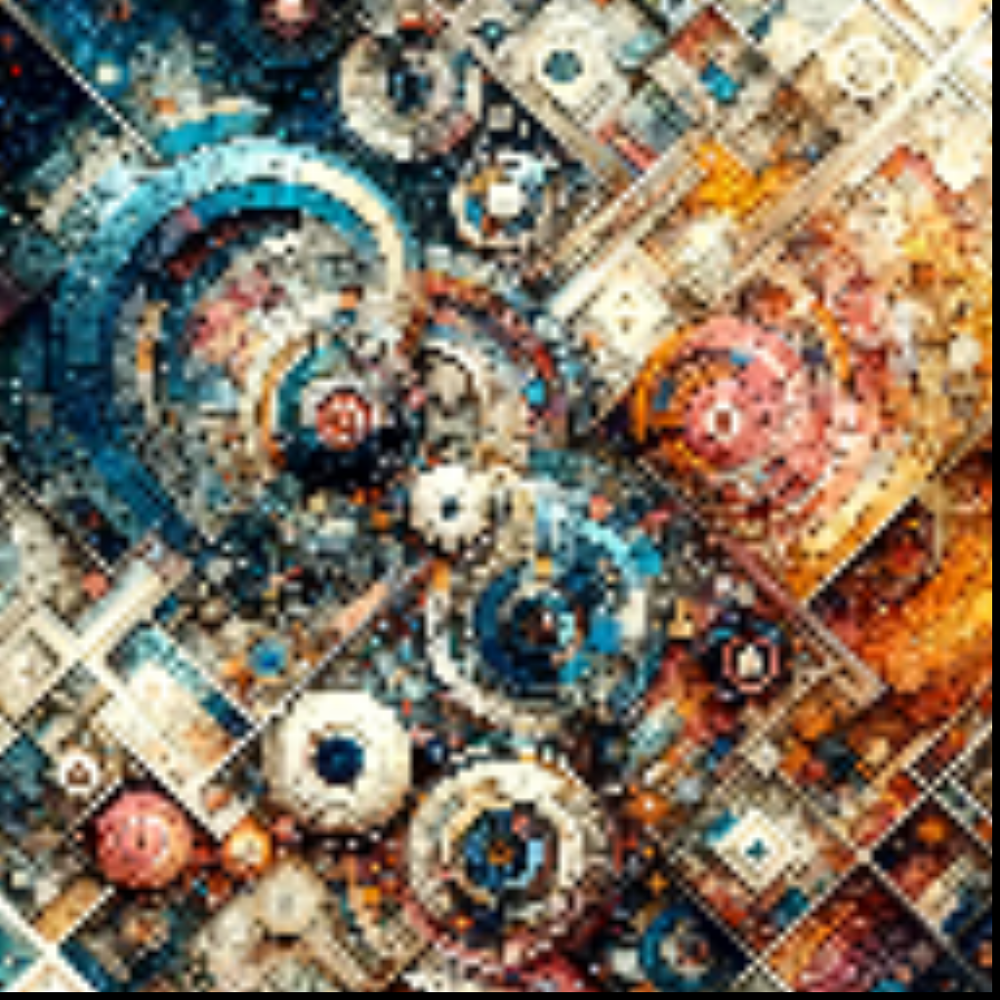

In [7]:
# 128*128->1024*1024
def nearest_neighbor_resize(image, new_width, new_height):
    original_width, original_height = image.size
    resized_image = Image.new("RGB", (new_width, new_height))
    pixels = resized_image.load()

    for i in range(new_width):
        for j in range(new_height):
            x = int(i * (original_width / new_width))
            y = int(j * (original_height / new_height))
            pixels[i, j] = image.getpixel((x, y))

    return resized_image

def bilinear_interpolation_resize(image, new_width, new_height):
    original_width, original_height = image.size
    resized_image = Image.new("RGB", (new_width, new_height))
    pixels = resized_image.load()

    for i in range(new_width):
        for j in range(new_height):
            x = i * (original_width / new_width)
            y = j * (original_height / new_height)

            x1, y1 = int(np.floor(x)), int(np.floor(y))
            x2, y2 = min(x1 + 1, original_width - 1), min(y1 + 1, original_height - 1)

            fr1 = (x - x1)
            fr2 = (x2 - x)
            fc1 = (y - y1)
            fc2 = (y2 - y)

            top_left = np.array(image.getpixel((x1, y1)))
            top_right = np.array(image.getpixel((x2, y1)))
            bottom_left = np.array(image.getpixel((x1, y2)))
            bottom_right = np.array(image.getpixel((x2, y2)))

            pixels[i, j] = tuple(((top_left * fr2 * fc2) + (top_right * fr1 * fc2) + 
                                 (bottom_left * fr2 * fc1) + (bottom_right * fr1 * fc1)).astype(int))

    return resized_image


original_image = Image.open("128.png")

nn_resized_image = nearest_neighbor_resize(original_image, 1024, 1024)
print("Resized Image using Nearest Neighbor Method:")
display(nn_resized_image)

bilinear_resized_image = bilinear_interpolation_resize(original_image, 1024, 1024)
print("Resized Image using Bilinear Interpolation Method:")
display(bilinear_resized_image)

Original Image 1:


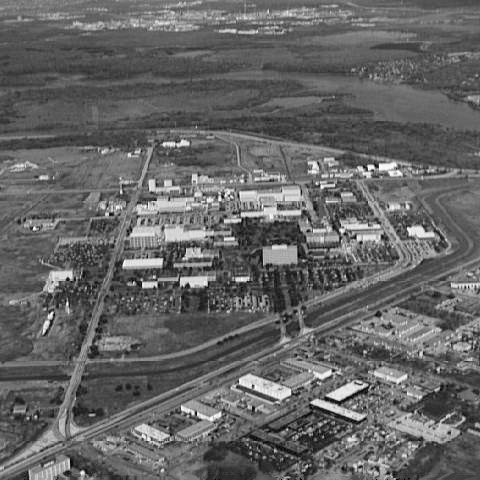

Original Image 2:


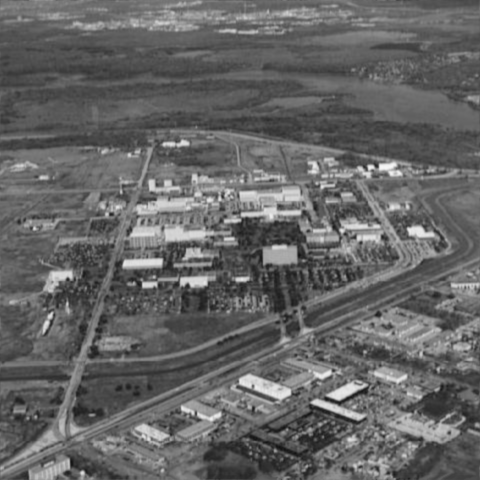

Resultant Image After Addition:


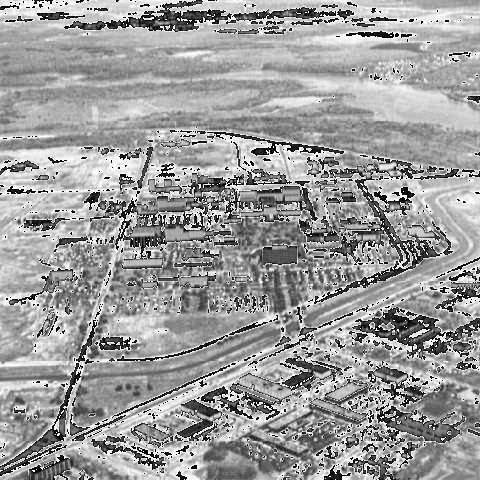

In [9]:
# Image addition
def add_images(image_path1,image_path2):
    image1 = Image.open(image_path1)
    image2 = Image.open(image_path2)

    if image1.size != image2.size:
        print("Resizing images to the same dimensions for addition.")
        image2 = image2.resize(image1.size)

    np_image1 = np.array(image1)
    np_image2 = np.array(image2)

    added_image = np_image1 + np_image2

    added_image = np.clip(added_image,0,255)

    result_image = Image.fromarray(added_image.astype('uint8'))

    return result_image

image_path1 = "+1 (1).tif"
image_path2 = "+1 (2).tif"

resultant_image = add_images(image_path1,image_path2)

print("Original Image 1:")
display(Image.open(image_path1))

print("Original Image 2:")
display(Image.open(image_path2))

print("Resultant Image After Addition:")
display(resultant_image)

original image:


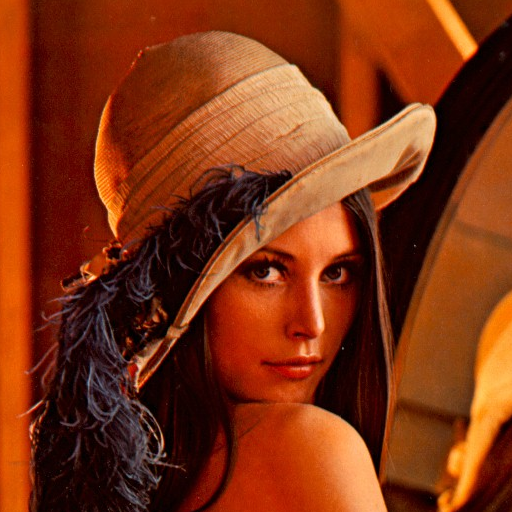

Image Outline:


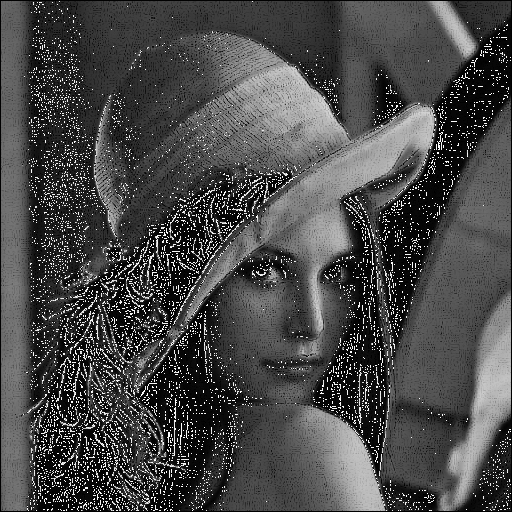

In [15]:
# Image subtraction_1
from PIL import Image, ImageFilter
def generate_image_outline(image_path):
    original_image = Image.open(image_path).convert('L')  
    edge_image = original_image.filter(ImageFilter.FIND_EDGES)

    np_original = np.array(original_image)
    np_edges = np.array(edge_image)

    outline_image = np.clip(np_original - np_edges, 0, 255)
    result_image = Image.fromarray(outline_image.astype('uint8'))

    return result_image

image_path = '-.tif'
resultant_image = generate_image_outline(image_path)
print("original image:")
display(Image.open(image_path))

print("Image Outline:")
display(resultant_image)

Image 1:


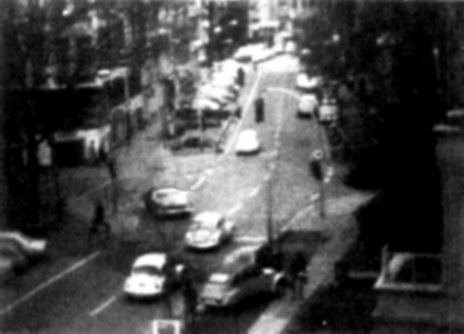

Image 2:


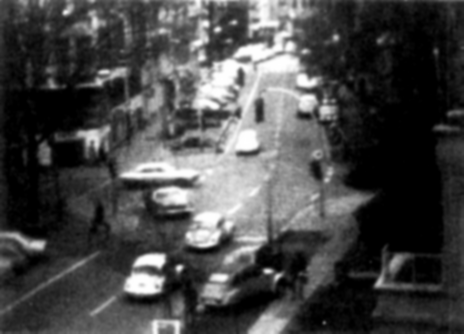

Resultant Image After Subtraction:


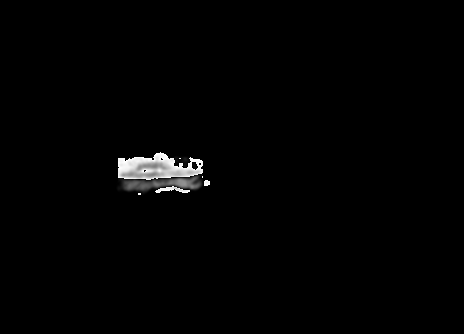

In [16]:
# Image subtraction_2
def subtract_images(image_path1,image_path2):
    image1 = Image.open(image_path1)
    image2 = Image.open(image_path2)

    if image1.size != image2.size:
        print("Resizing images to the same dimensions for subtraction.")
        image2 = image2.resize(image1.size)

    np_image1 = np.array(image1)
    np_image2 = np.array(image2)

    subtract_image = np.clip(np_image1 - np_image2,0,255)

    result_image = Image.fromarray(subtract_image.astype('uint8'))

    return result_image

image_path1 = "-2 (1).tif"
image_path2 = "-2 (2).tif"

resultant_image = subtract_images(image_path1,image_path2)

print("Image 1:")
display(Image.open(image_path1))

print("Image 2:")
display(Image.open(image_path2))

print("Resultant Image After Subtraction:")
display(resultant_image)

Image 1:


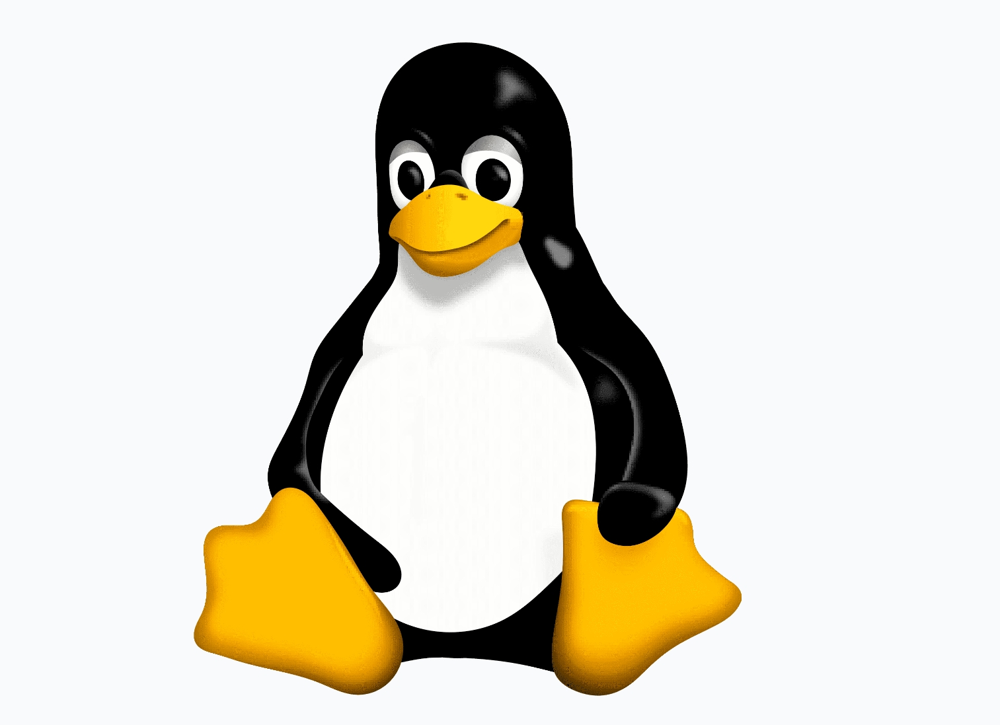

Image 2:


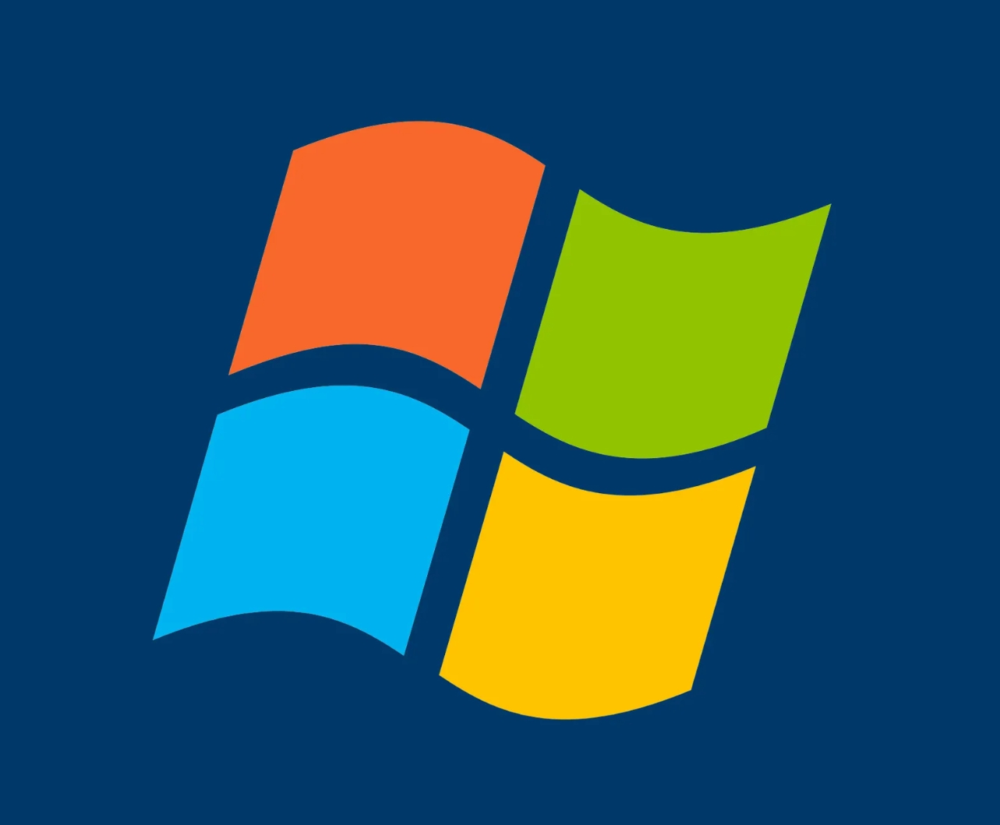

Resizing images to the same dimensions for multiplication.
Multiplied Image:


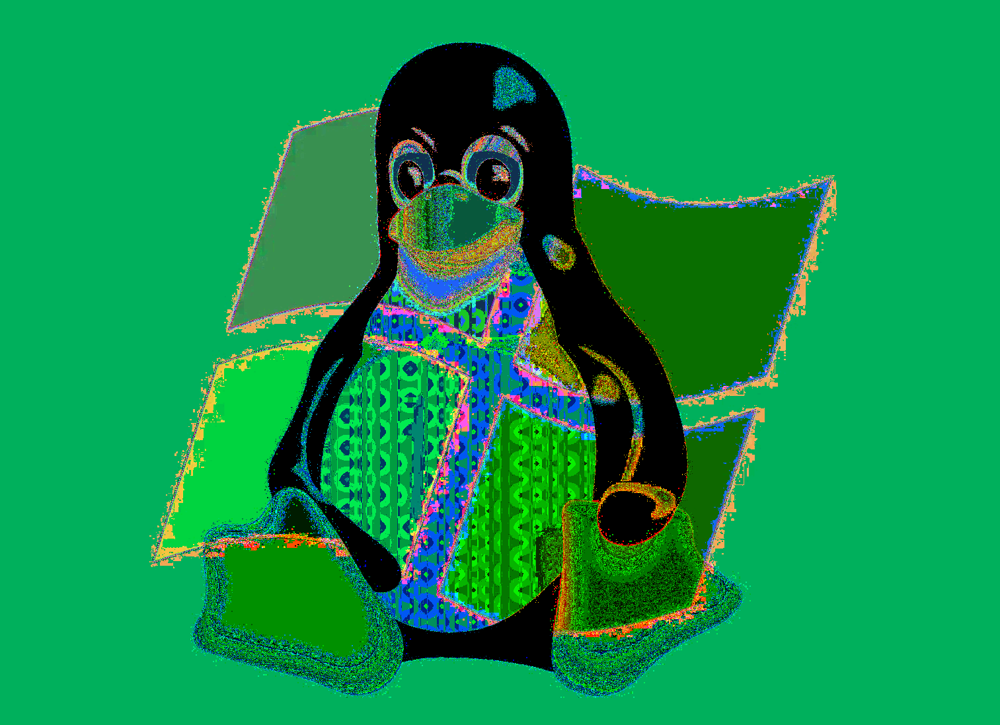

Scalar Multiplied Image:


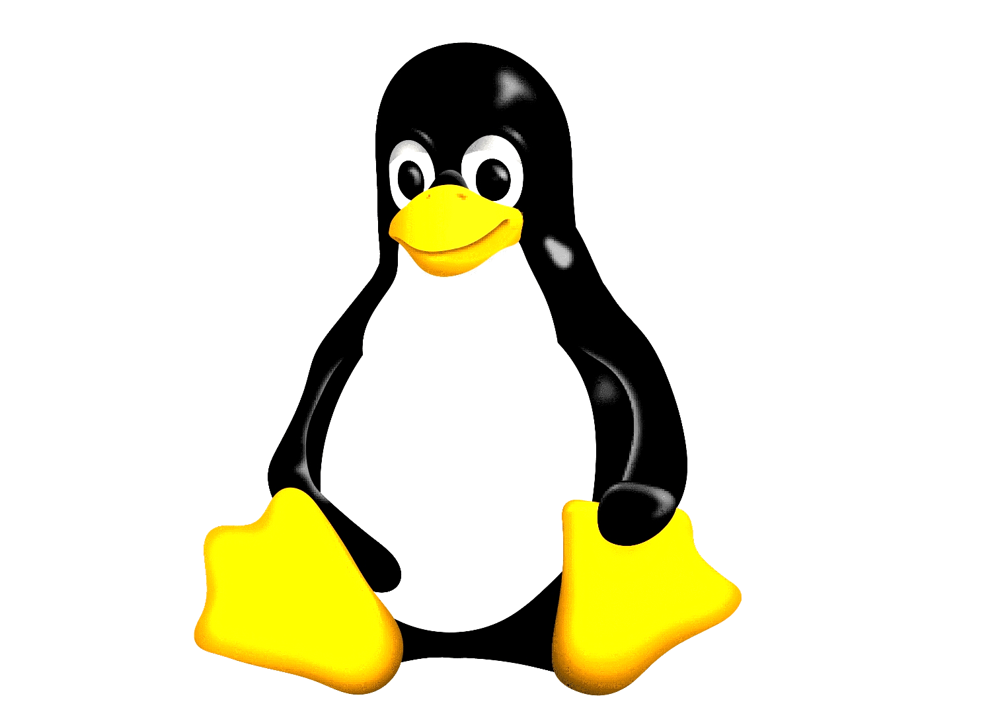

Squared Image:


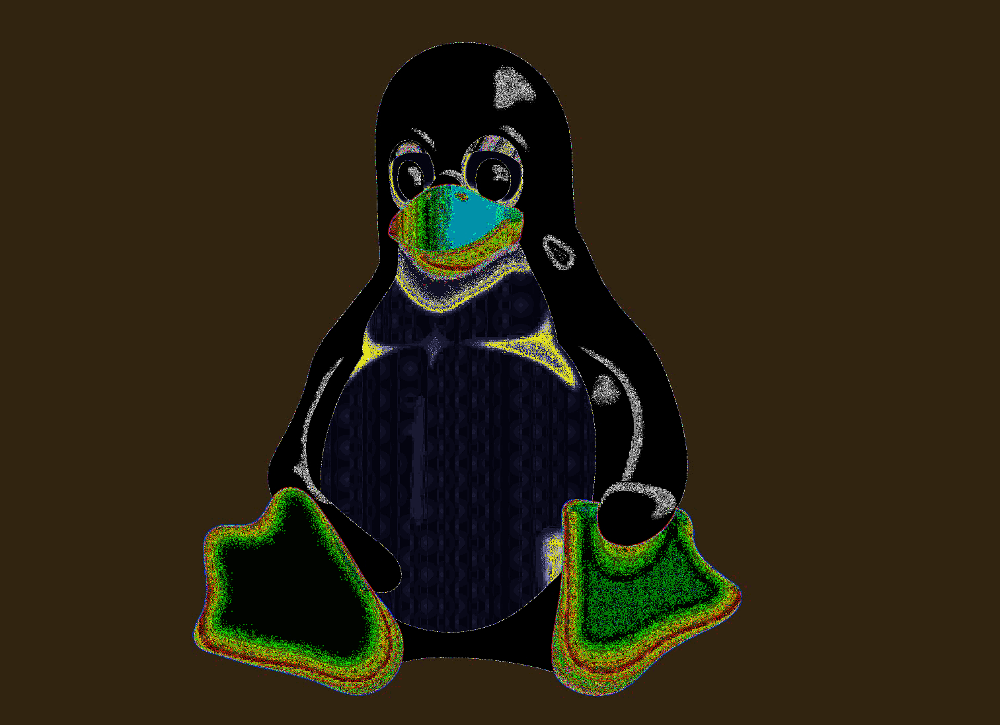

In [18]:
# Image multiplication
def multiply_images(image_path1,image_path2):
    image1 = Image.open(image_path1)
    image2 = Image.open(image_path2)

    if image1.size != image2.size:
        print("Resizing images to the same dimensions for multiplication.")
        image2 = image2.resize(image1.size)

    np_image1 = np.array(image1)
    np_image2 = np.array(image2)

    multiplied_image = np.clip(np_image1 * np_image2,0,255)

    return Image.fromarray(multiplied_image.astype('uint8'))

def scalar_multiply_image(image_path,scalar):
    image = Image.open(image_path)

    np_image = np.array(image)

    scaled_image = np.clip(np_image * scalar,0,255)

    return Image.fromarray(scaled_image.astype('uint8'))

def square_image(image_path):
    image = Image.open(image_path)

    np_image = np.array(image)

    squared_image = np.clip(np_image ** 2,0,255)

    return Image.fromarray(squared_image.astype('uint8'))

image_path1 = "Linux.png"
image_path2 = "Windows.png"

print("Image 1:")
display(Image.open(image_path1))

print("Image 2:")
display(Image.open(image_path2))

multiplied_image = multiply_images(image_path1, image_path2)

scalar = 1.5
scalar_multiplied_image  = scalar_multiply_image(image_path1,scalar)

squared_image = square_image(image_path1)

print("Multiplied Image:")
display(multiplied_image)

print("Scalar Multiplied Image:")
display(scalar_multiplied_image)

print("Squared Image:")
display(squared_image)